In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

Why Object detection requires binary image?

OpenCV needs a clear separation of object (foreground) and background, and a binary image gives that.
Contours = boundaries of white regions.

cv2.THRESH_BINARY_INV

Objects → black
Background → white


cv2.THRESH_BINARY

Objects → white (what is actually needed for obj detection)
Background → black

### Q1. Write a Python program to detect all objects in an image named "nuts_bolts.jpg" using thresholding and contour detection, count them, and compute summary statistics such as:​

1. mean area​
2. median area​
3. largest object area​
4. smallest object area​
5. Print the analysis clearly.

#cv2.findContours(...) Extracts all object boundaries from the binary image.​

#binary: The black & white segmented image.​

#cv2.RETR_EXTERNAL: Retrieves only outer contours (ignores internal holes).​

#cv2.CHAIN_APPROX_SIMPLE: Compresses contour points for efficient storage.​

#contours: List containing all detected object boundaries (each is a list of points).​

#hierarchy: Contains parent-child relationships (not used here).

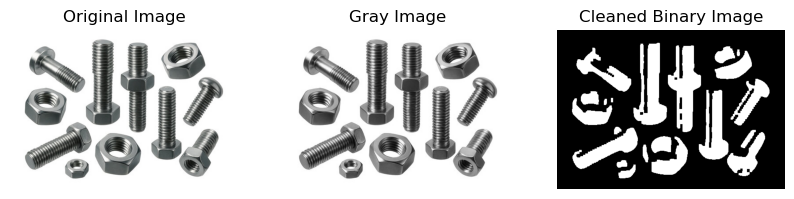

In [320]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
img = cv2.imread('nut_bolts5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Blur to reduce noise
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Threshold (objects white, background black)
_, binary = cv2.threshold(blur, 150, 255, cv2.THRESH_BINARY_INV)

# Morphological cleaning (VERY IMPORTANT)
kernel = np.ones((5,5), np.uint8)
clean = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
clean = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel)

# Display images
plt.figure(figsize=(10,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(gray, cmap='gray')
plt.title("Gray Image")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(clean, cmap='gray')
plt.title("Cleaned Binary Image")
plt.axis('off')

plt.show()



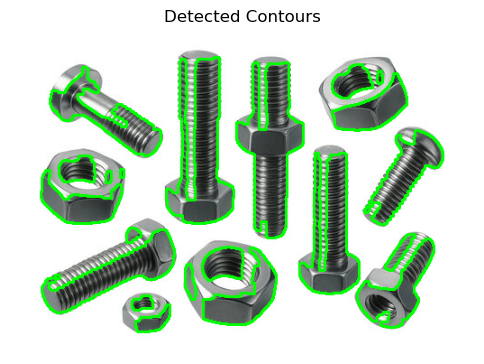

Number of objects detected: 21


In [321]:
# Find contours
contours, hierarchy = cv2.findContours(
    clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)

# Draw contours
contour_img = img.copy()
cv2.drawContours(contour_img, contours, -1, (0,255,0), 2)

plt.figure(figsize=(6,6))
plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

print("Number of objects detected:", len(contours))


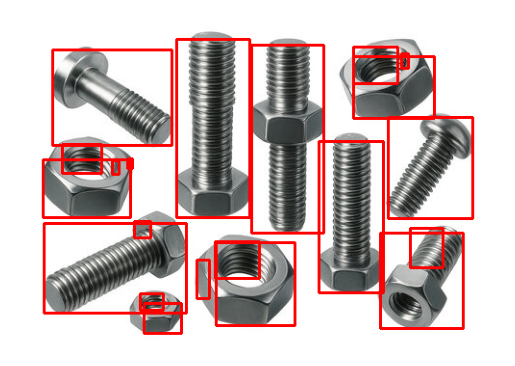

In [322]:
output = img.copy()
count = 0
for cnt in contours:
    count+=1
    x,y,w,h = cv2.boundingRect(cnt)             #computes the smallest upright rectangle that completely encloses a contour.
                                                #Calculates a bounding box around the contour
    cv2.rectangle(output,(x,y),(x+w,y+h),(255,0,0),2)
# | Parameter    | Meaning             |
# | ------------ | ------------------- |
# | `output`     | Image to draw on    |
# | `(x,y)`      | Top-left corner     |
# | `(x+w, y+h)` | Bottom-right corner |
# | `(255,0,0)`  | Color (Blue in BGR) |
# | `2`          | Line thickness      |

plt.imshow(output)
plt.axis('off')
plt.show()


In [323]:
import numpy as np

# areas of all detected contours
areas = [cv2.contourArea(cnt) for cnt in contours] #It calculates the area of every contour in the image and stores those areas in a list.

# convert to numpy array for easy stats
areas = np.array(areas)


mean_area = np.mean(areas)
median_area = np.median(areas)
largest_area = np.max(areas)
smallest_area = np.min(areas)


print("------ OBJECT AREA ANALYSIS ------")
print(f"Total objects detected : {len(areas)}")
print(f"Mean area              : {mean_area:.2f}")
print(f"Median area            : {median_area:.2f}")
print(f"Largest object area    : {largest_area:.2f}")
print(f"Smallest object area   : {smallest_area:.2f}")
print("----------------------------------")


------ OBJECT AREA ANALYSIS ------
Total objects detected : 21
Mean area              : 2312.40
Median area            : 1319.00
Largest object area    : 7567.50
Smallest object area   : 36.00
----------------------------------


### Q2. Load "shapes2.png", detect all contours, classify each object as triangle, square/rectangle, or circle, and create a table (using a list of dictionaries or pandas DataFrame) summarizing:
1. object ID
2. shape
3. area
4. perimeter
Display the DataFrame.

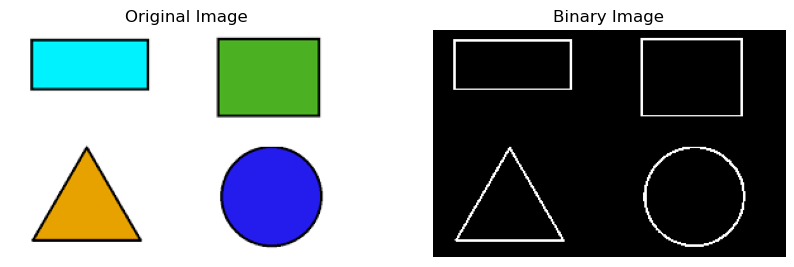

In [103]:
img = cv2.imread("shape.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,70,255,cv2.THRESH_BINARY_INV)
# | Pixel Value | Result (INVERTED) |
# | ----------- | ----------------- |
# | > 120       | 0 (Black)         |
# | ≤ 120       | 255 (White)       |


plt.figure(figsize = (10,4)) # width x height

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis('off')
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(binary,cmap = 'gray')
plt.axis('off')
plt.title("Binary Image")

plt.show()


### Contour Detection

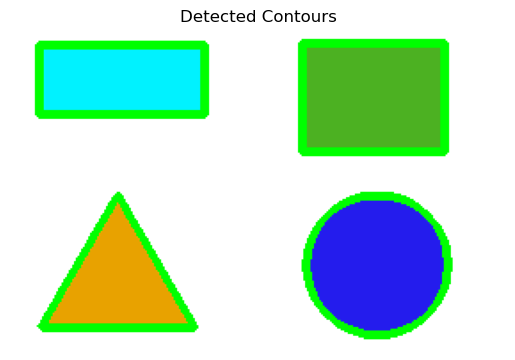

In [104]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()
# | Parameter                 | Meaning                                                        |
# | ------------------------- | -------------------------------------------------------------- |
# | `binary`                  | Binary image (white objects on black background)               |
# | `cv2.RETR_EXTERNAL`       | Detects **only outer contours** (ignores holes inside objects) |
# | `cv2.CHAIN_APPROX_SIMPLE` | Compresses contour points to save memory                       |


cv2.drawContours(contour_img,contours,-1,(0,255,0),3)
# | Parameter     | Meaning                   |
# | ------------- | ------------------------- |
# | `contour_img` | Image to draw on          |
# | `contours`    | List of detected contours |
# | `-1`          | Draw **all contours**     |
# | `(0,255,0)`   | Green color (BGR format)  |
# | `3`           | Line thickness            |

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()


1. approx = cv2.approxPolyDP(cnt, 0.04 * peri, True)
    * Every contour has many points.
    * approxPolyDP simplifies the contour into fewer points.
    * 0.04 * peri controls how much simplification (4% of perimeter).
    * Result:
        * A triangle becomes 3 points
        * A rectangle becomes 4 points
        * A circle becomes many points, but simplification makes it 8–10 points

2. Checking if corners == 4 for Square/Rectangle
    * x, y, w, h = cv2.boundingRect(approx)
      * Draws the smallest box around the shape.
      * w = width of the box
      * h = height of the box
    * aspect_ratio = w / float(h)
      * Squares have width ≈ height → ratio ≈ 1
      * Rectangles have width ≠ height → ratio far from 1
    * if 0.95 < aspect_ratio < 1.05:
      * If ratio is very close to 1 → Square
      * else rectangle

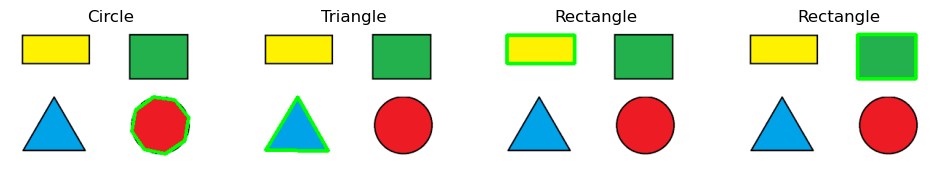

In [105]:
import pandas as pd

data = []

plt.figure(figsize=(12, 4))

for i, cnt in enumerate(contours, start=1):  #loops through all contours, giving each contour a unique index starting from 1.
    peri = cv2.arcLength(cnt, True)          #cnt represents one object boundary
    area = cv2.contourArea(cnt)
    approx = cv2.approxPolyDP(cnt, 0.04 * peri, True)
    corners = len(approx)

    # classify shape
    if corners == 3:
        shape = "Triangle"
    elif corners == 4:
        x, y, w, h = cv2.boundingRect(approx)
        aspect_ratio = w / float(h)
        if 0.94 <= aspect_ratio <= 1.05:
            shape = "Square"  
        else:
            shape = "Rectangle"
    else:
        shape = "Circle"

    data.append({
        "Object ID": i,
        "Shape": shape,
        "Area": area,
        "Perimeter": peri
    })

    # draw contour on a fresh image
    temp = img.copy()
    cv2.drawContours(temp, [approx], -1, (0,255,0), 3)

    # display in subplot i
    plt.subplot(1, len(contours), i)
    plt.imshow(cv2.cvtColor(temp, cv2.COLOR_BGR2RGB))
    plt.title(shape)
    plt.axis('off')

plt.show()
df = pd.DataFrame(data)


In [106]:
df

,Object ID,Shape,Area,Perimeter
0,1,Circle,4921.0,263.279218
1,2,Triangle,3242.0,269.622364
2,3,Rectangle,3627.0,264.000000
3,4,Rectangle,4880.0,282.000000


### Q3. Read an image "metal_parts.png". Detect all parts using contour detection. Then identify defective parts where:​ the convexity defect count is > 5 OR area is below a threshold 
Calculate and print:​
1. total parts​
2. defective parts​
3. defect percentage​

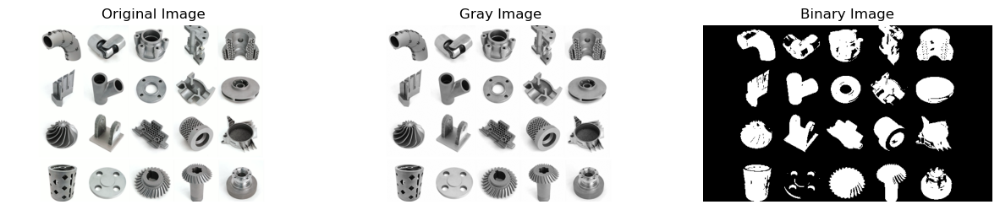

In [109]:
img = cv2.imread("metal_parts.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,180,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (15,6))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.title("Gray Image")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.title("Binary Image")
plt.axis("off")

plt.show()


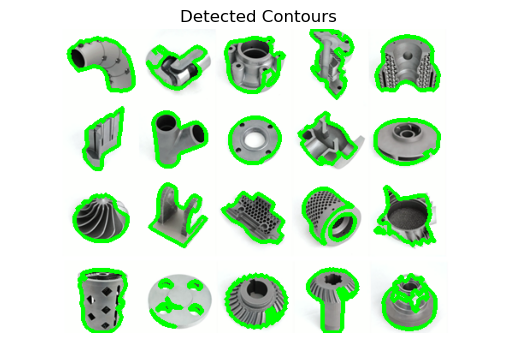

In [113]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [114]:
defective_count = 0
area_threshold = 1500   # adjust later

for cnt in contours:

    # --- 1. Compute area ---
    area = cv2.contourArea(cnt)

    # --- 2. Compute convex hull for drawing (points) ---
    hull_points = cv2.convexHull(cnt)                         #points (for drawing/visualization)

    # --- 3. Compute convex hull for defects (indices) ---
    hull_indices = cv2.convexHull(cnt, returnPoints=False)    #indices (for convexity defect calculation)

    defect_count = 0
    if hull_indices is not None and len(hull_indices) > 3:
        try:
            defects = cv2.convexityDefects(cnt, hull_indices)  #safely computes convexity defects for a contour and prevents runtime errors when the contour is too small or invalid.
            if defects is not None:
                defect_count = defects.shape[0]
        except:
            defect_count = 0   # if error → treat as no defects

    # --- 4. Mark defective ---
    if defect_count > 5 or area < area_threshold:
        defective_count += 1


In [115]:
total_parts = len(contours)
defect_percentage = (defective_count / total_parts) * 100

print("Total parts:", total_parts)
print("Defective parts:", defective_count)
print("Defect percentage: {:.2f}%".format(defect_percentage))


Total parts: 28
Defective parts: 28
Defect percentage: 100.00%


### Q4. Load "coins.jpg", segment each coin, compute each coin's radius using enclosing circles. Assume radius ranges represent denominations:
* small = Rs2
* medium = Rs5
* large = Rs10

### Calculate total monetary value of coins in the image

if pixel >= 130:
    pixel = 255   (white)
else:
    pixel = 0     (black)

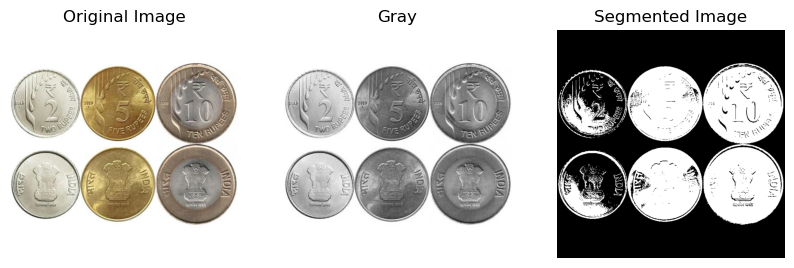

In [162]:
img = cv2.imread("coins.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

plt.figure(figsize = (10,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis("Off")
plt.title("Segmented Image")

plt.show()

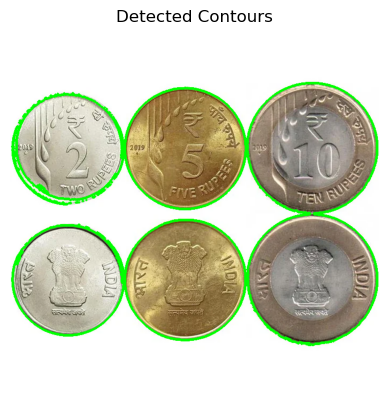

In [163]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [176]:
circles = []
radii = []
for i,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)

    if perimeter == 0:
        continue

    circularity = 4 * np.pi * area / (perimeter * perimeter)

    if circularity > 0.35:
        r = perimeter / (2*np.pi)
        radii.append(round(r))
        circles.append(perimeter)

Understanding formula: circularity = 4 * np.pi * area / (perimeter * perimeter)

Imagine you have a rope:
* You can make a circle with it Or a zig-zag shape. Both use the same rope length.
* But: The circle covers more space. The zig-zag covers less space
So circle = more area for the same boundary

If you calculate the final formula value for circle it would be 1.

Other shapes:
* Have less area for the same boundary
* Or more boundary for the same area

So:
* Numerator (area part) becomes smaller
* Denominator (perimeter² part) becomes larger

In [177]:
print(radii)

[149, 120, 1, 2, 1, 1, 152, 121, 272]


In [178]:
# Radii value computed manually
total = 0
for r in radii:
    if r <= 150:
        total += 1    # Rs2
    elif r>150 and r<=180:
        total += 2    # Rs5
    else:
        total += 5    # Rs10

In [179]:
print(total)

14


Detected radii: [105, 114, 104, 114, 247]
Total Monetary Value = Rs 18


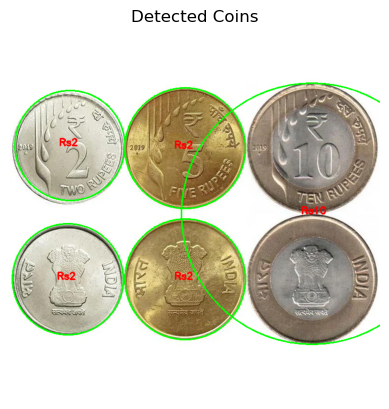

In [180]:
contour_img = img.copy()
radii = []
total = 0

# Process each coin
for cnt in contours:
    area = cv2.contourArea(cnt)

    # Remove tiny noise contours
    if area < 500:
        continue

    perimeter = cv2.arcLength(cnt, True)

    if perimeter == 0:
        continue

    circularity = 4 * np.pi * area / (perimeter ** 2)

    # Keep circular objects only (coins)
    if circularity > 0.40:
        (x, y), r = cv2.minEnclosingCircle(cnt)
        r = int(r)

        # Extra safety: ignore tiny circles
        if r < 30:
            continue

        radii.append(r)

        # Denomination based on radius
        if r <= 130:
            value = 2      # Rs2
        elif r <= 160:
            value = 5      # Rs5
        else:
            value = 10     # Rs10

        total += value

        # Draw detected coin
        cv2.circle(contour_img, (int(x), int(y)), r, (0,255,0), 2)
        cv2.putText(
            contour_img, f"Rs{value}",
            (int(x)-20, int(y)),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2
        )

print("Detected radii:", radii)
print("Total Monetary Value = Rs", total)

plt.imshow(contour_img)
plt.title("Detected Coins")
plt.axis("off")
plt.show()


### Q5. Detect all objects in "items.png", extract bounding box coordinates, and then generate a scatter-like plot of object centroids (x,y). Perform a simple analysis:
* Which quadrant has the most objects?
* Are objects clustered or spread uniformly?

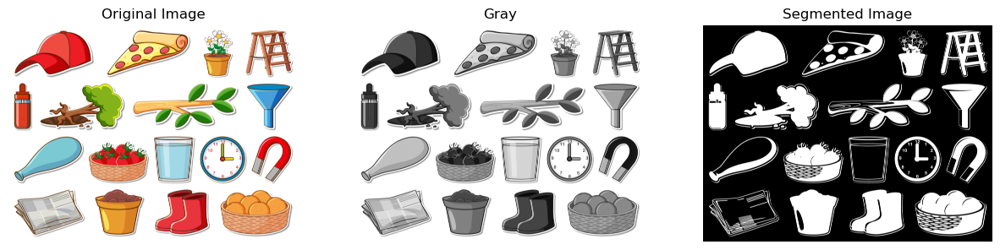

In [186]:
img = cv2.imread("items.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) #Otsu’s method automatically computes the optimal threshold
                                                                             #do not manually choose the threshold.
                                                                                # | Condition         | Output      |
                                                                                # | ----------------- | ----------- |
                                                                                # | pixel > threshold | 0 (black)   |
                                                                                # | pixel ≤ threshold | 255 (white) |

plt.figure(figsize = (15,6))

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis("Off")
plt.title("Segmented Image")

plt.show()

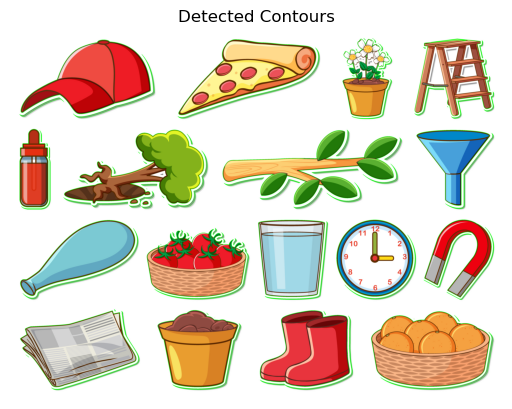

In [187]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

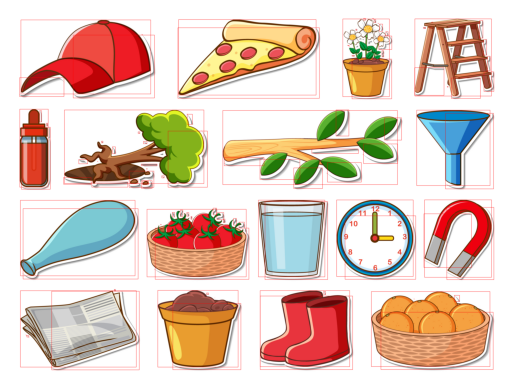

In [188]:
output = img.copy()
count = 0
x_centroid = []
y_centroid = []
for cnt in contours:
    count+=1
    x,y,w,h = cv2.boundingRect(cnt)

    # This works because x, y are the top-left corner of the rectangle, and w, h are the width and height. Adding half of the width/height gives the center.
    cx = x + w / 2
    cy = y + h / 2

    x_centroid.append(cx)
    y_centroid.append(cy)
    
    cv2.rectangle(output,(x,y),(x+w,y+h),(255,0,0),2)
plt.imshow(output)
plt.axis('off')
plt.show()

In [189]:
print(len(y_centroid))

135


In [190]:
h, w = img.shape[:2]

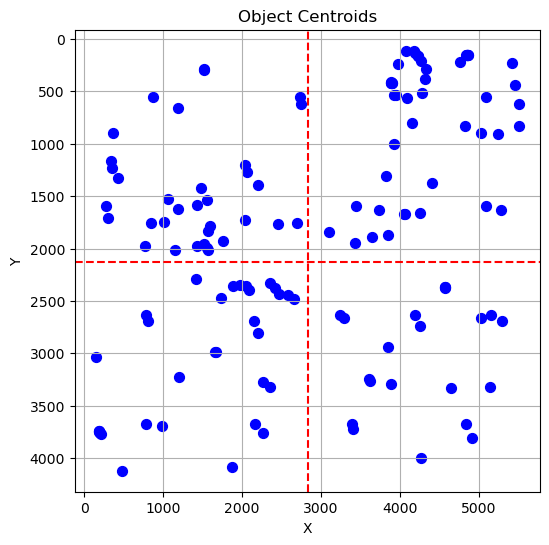

In [191]:
plt.figure(figsize=(6,6))  # 6 inches × 6 inches
plt.scatter(x_centroid, y_centroid, color='blue', s=50)  # s = size of points

plt.axvline(x=w/2, color='red', linestyle='--')  # vertical line
plt.axhline(y=h/2, color='red', linestyle='--')  # horizontal line

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Object Centroids')
plt.grid(True)
plt.gca().invert_yaxis()
plt.show()

In [192]:
h, w = img.shape[:2]

# Quadrant counters
q1 = 0  # top-left
q2 = 0  # top-right
q3 = 0  # bottom-left
q4 = 0  # bottom-right

for cx, cy in zip(x_centroid, y_centroid):
    if cx < w/2 and cy < h/2:
        q1 += 1
    elif cx >= w/2 and cy < h/2:
        q2 += 1
    elif cx < w/2 and cy >= h/2:
        q3 += 1
    else:
        q4 += 1

print("Top-left quadrant:", q1)
print("Top-right quadrant:", q2)
print("Bottom-left quadrant:", q3)
print("Bottom-right quadrant:", q4)


Top-left quadrant: 34
Top-right quadrant: 48
Bottom-left quadrant: 32
Bottom-right quadrant: 21


In [193]:
# Convert centroids into points. zip combines into (x1, y1), (x2, y2), (x3, y3) ...
points = np.array(list(zip(x_centroid, y_centroid)))

# Compute pairwise distances
distances = []

for i in range(len(points)):
    for j in range(i+1, len(points)):
        
        # This is the Euclidean distance formula:
        d = np.linalg.norm(points[i] - points[j])
        distances.append(d)

# Average distance summarizes overall spacing
avg_distance = np.mean(distances)
print("Average distance between objects:", avg_distance)

Average distance between objects: 2496.8910053964164


In [194]:
# This is the maximum possible distance in the image (top-left to bottom-right).We need this so our distance comparison is scale-independent.
image_diag = np.sqrt(w**2 + h**2)

# It’s a simple threshold, If objects are on average closer than ~50% of image size → clustered otherwise uniformly spread
if avg_distance < image_diag / 2:
    print("Objects are CLUSTERED")
else:
    print("Objects are UNIFORMLY SPREAD")


Objects are CLUSTERED


### Q6. Extract contour areas from "geometric_objects.jpg".Plot a histogram of all contour areas using Matplotlib. Interpret:
* Do objects have similar sizes?
* Are there outliers?
Write a short comment.

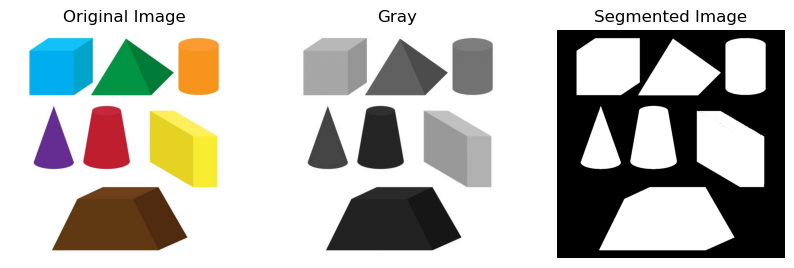

In [195]:
img = cv2.imread("geometric_objects.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,200,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis("Off")
plt.title("Segmented Image")

plt.show()

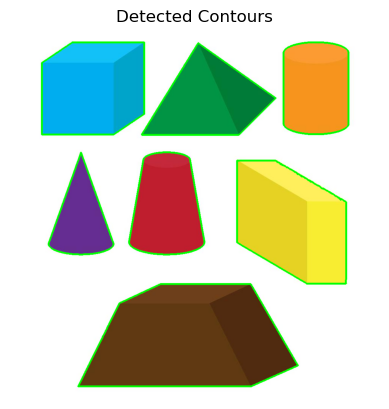

In [196]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [197]:
area = []
for i,cnt in enumerate(contours):
    value = cv2.contourArea(cnt)
    area.append(value)
    print(value)

120495.0
73823.5
24637.5
42293.5
48489.5
39859.0
61750.0


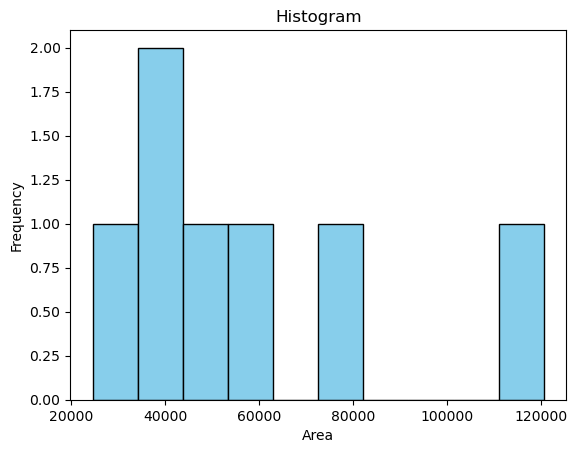

In [198]:
plt.hist(area,color='skyblue', edgecolor='black')

# Adding labels and title
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.title('Histogram')

# Display the plot
plt.show()

The histogram displays distribution of the area of shapes. 
* The tallest bar is in the range of approximately 33,000 to 46,000. This means the most common size for a shape's area is within this relatively smaller range.
* There is a gap in the data between the bin from 72,000-85,000 and the final bin from 111,000-124,000. The single shape in that last bin is significantly larger than the others, suggesting an outlier or a shape of a distinctly different size class.
* The distribution is highly skewed to the right (positively skewed) and non-uniform.

### Q7. Using "crops.jpg", apply:​
* global thresholding​
* adaptive thresholding​
### For each method, count detected objects and calculate:​
* mean object area​
* number of missed objects
  
Print a comparison table.

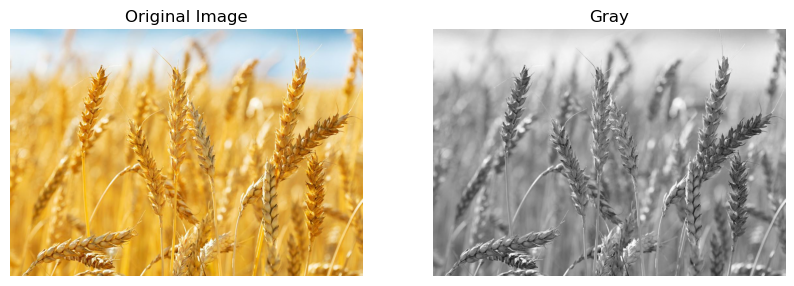

In [221]:
img = cv2.imread("crops.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize = (10,4))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.show()

# Global Thresholding:

In [222]:
global_thresh = {}

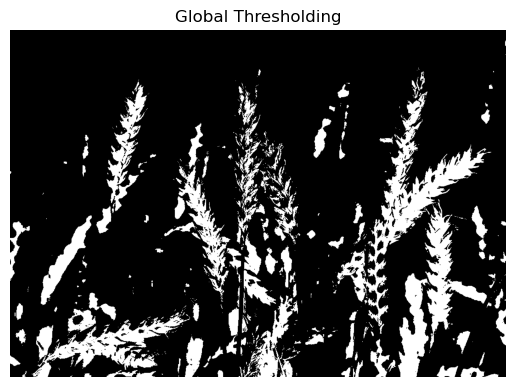

In [223]:
T = 120                                                               #(manual Thhreshold)
_,binary = cv2.threshold(gray,T,255,cv2.THRESH_BINARY_INV)
plt.imshow(binary,cmap = 'gray')
plt.title("Global Thresholding")
plt.axis('off')
plt.show()

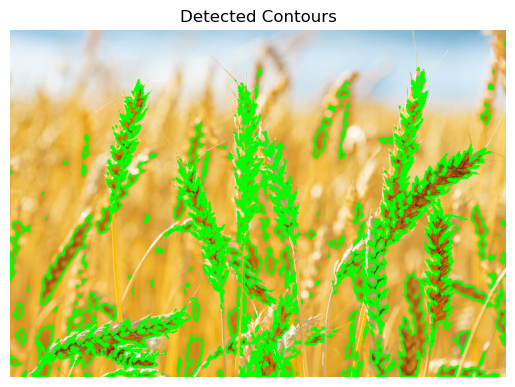

In [224]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [225]:
num_detected = len(contours)
print("Detected objects:", num_detected)
global_thresh['Detected Object (Before Erosion)'] = num_detected

Detected objects: 1462


In [226]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)

In [227]:
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
global_thresh['Mean Area (Before Erosion)'] = mean_area

Mean object area: 93.1922024623803


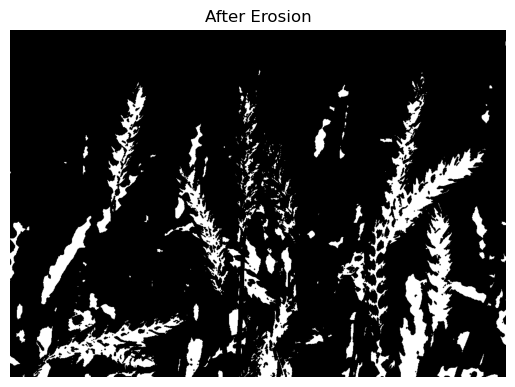

In [228]:
# It applies erosion, a morphological operation, to a binary image in order to remove small noise, thin objects,
# and separate touching objects, and then displays the result.

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
eroded = cv2.erode(binary, kernel, iterations=1)
# | Step       | Purpose               |
# | ---------- | --------------------- |
# | Kernel     | Defines erosion shape |
# | Erosion    | Shrinks white objects |
# | Iterations | Controls strength     |
# | Display    | Visual verification   |


plt.imshow(eroded, cmap='gray')
plt.title("After Erosion")
plt.axis('off')
plt.show()

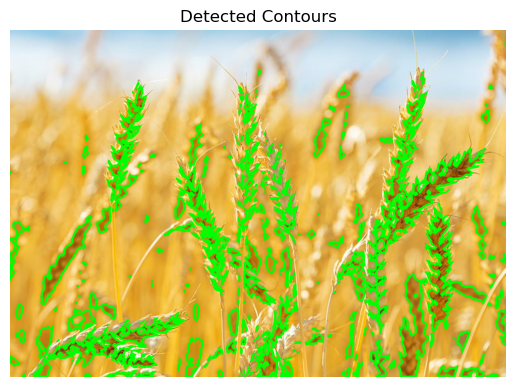

In [229]:
contours,hierarchy = cv2.findContours(eroded,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [230]:
num_detected = len(contours)
print("Detected objects:", num_detected)
global_thresh['Detected Object (After Erosion)'] = num_detected

Detected objects: 699


In [231]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
global_thresh['Mean Area (After Erosion)'] = mean_area

Mean object area: 146.81473533619456


In [232]:
print(global_thresh)

{'Detected Object (Before Erosion)': 1462, 'Mean Area (Before Erosion)': 93.1922024623803, 'Detected Object (After Erosion)': 699, 'Mean Area (After Erosion)': 146.81473533619456}


# Adaptive Thresholding

In [233]:
adap_thresh = {}

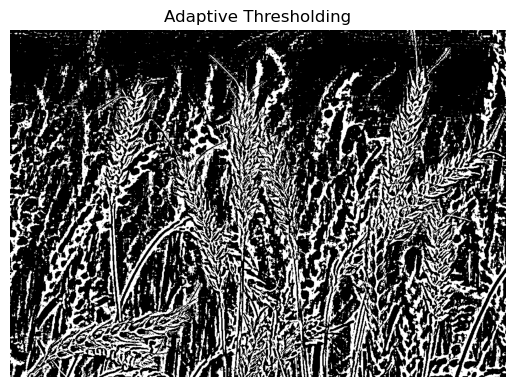

In [234]:
binary_adaptive = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY_INV,11,2)

# | C value | Effect             |          11 → Block size
# | ------- | ------------------ |          Size of local neighborhood-->Must be odd
# | Small   | More white pixels  |          Larger value → smoother threshold
# | Large   | Fewer white pixels |          Smaller value → more sensitive. (11×11 window around each pixel)

plt.imshow(binary_adaptive, cmap='gray')
plt.title("Adaptive Thresholding")
plt.axis('off')
plt.show()


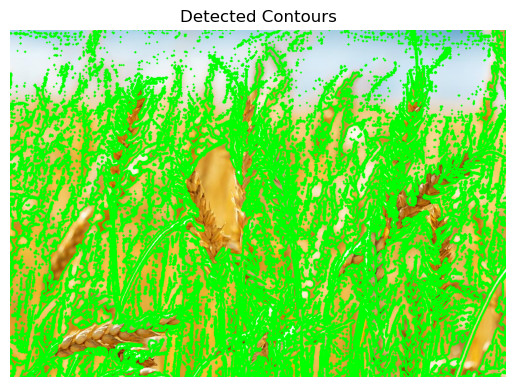

In [235]:
contours,hierarchy = cv2.findContours(binary_adaptive,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [236]:
num_detected = len(contours)
print("Detected objects:", num_detected)
adap_thresh['Detected Object (Before Erosion)'] = num_detected

Detected objects: 4006


In [237]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
adap_thresh['Mean Area (Before Erosion)'] = mean_area

Mean object area: 58.5481777333999


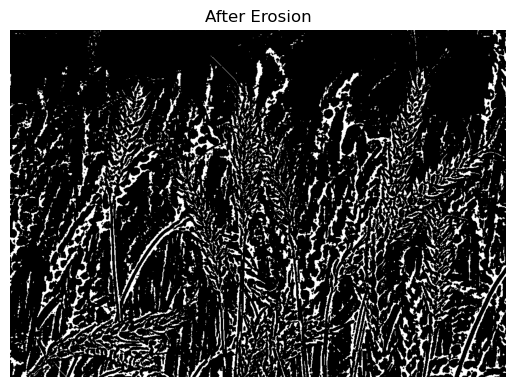

In [238]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
eroded = cv2.erode(binary_adaptive, kernel, iterations=1)

plt.imshow(eroded, cmap='gray')
plt.title("After Erosion")
plt.axis('off')
plt.show()

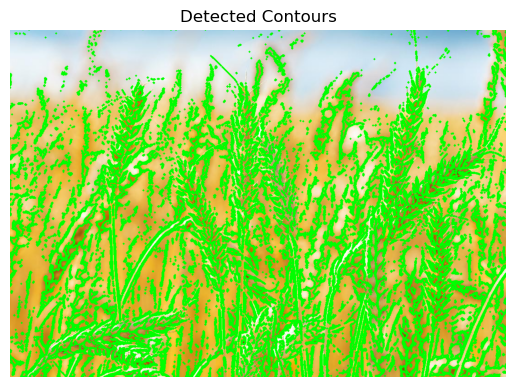

In [239]:
contours,hierarchy = cv2.findContours(eroded,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [240]:
num_detected = len(contours)
print("Detected objects:", num_detected)
adap_thresh['Detected Object (After Erosion)'] = num_detected

Detected objects: 3271


In [241]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
adap_thresh['Mean Area (After Erosion)'] = mean_area

Mean object area: 24.797156832772853


In [242]:
print(adap_thresh)

{'Detected Object (Before Erosion)': 4006, 'Mean Area (Before Erosion)': 58.5481777333999, 'Detected Object (After Erosion)': 3271, 'Mean Area (After Erosion)': 24.797156832772853}


In [243]:
import pandas as pd
df = pd.DataFrame([global_thresh,adap_thresh],index = ['Global Thresh','Adap Thresh'])
df

,Detected Object (Before Erosion),Mean Area (Before Erosion),Detected Object (After Erosion),Mean Area (After Erosion)
Global Thresh,1462,93.192202,699,146.814735
Adap Thresh,4006,58.548178,3271,24.797157


### Q8. Add Gaussian noise to "packets.jpg", then detect contours before and after applying median filtering.​
Calculate: 
* difference in number of contours​
* change in average area​
* percentage improvement in detection accuracy

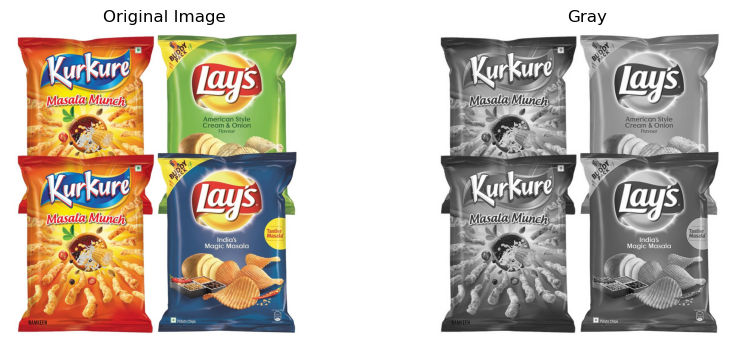

In [257]:
img = cv2.imread("packets.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize = (10,4))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.show()

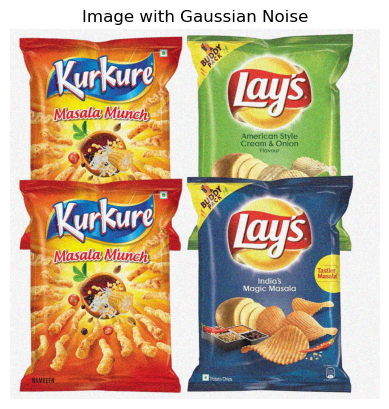

In [258]:
noise = np.random.normal(0, 25, img.shape).astype(np.float32)
gaussian_img = cv2.add(img.astype(np.float32), noise)
gaussian_img = np.clip(gaussian_img, 0, 255).astype(np.uint8)

plt.imshow(gaussian_img)
plt.title("Image with Gaussian Noise")
plt.axis("off")
plt.show()

# Before Median Filtering

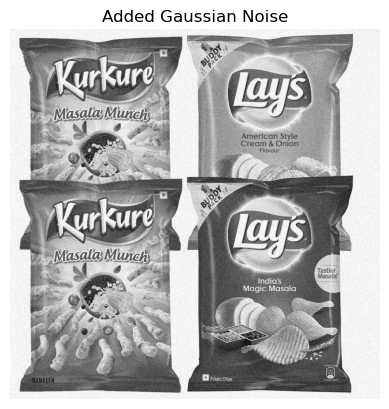

In [259]:
gray_noisy = cv2.cvtColor(gaussian_img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray_noisy,cmap = 'gray')
plt.title("Added Gaussian Noise")
plt.axis('off')
plt.show()

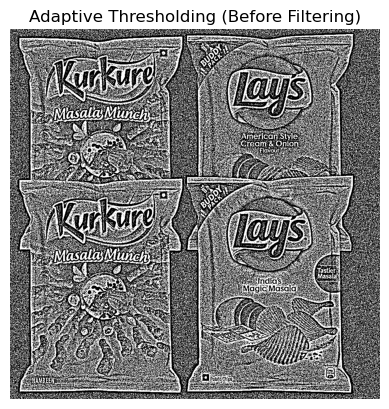

In [260]:
binary_before = cv2.adaptiveThreshold(
    gray_noisy,
    255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY_INV,
    11,
    2
)

plt.imshow(binary_before, cmap='gray')
plt.title("Adaptive Thresholding (Before Filtering)")
plt.axis("off")
plt.show()

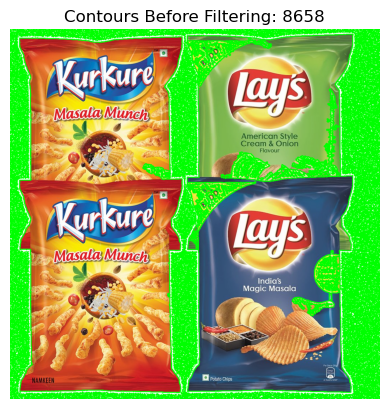

In [261]:
contours_before, _ = cv2.findContours(
    binary_before,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

contour_img_before = img.copy()
cv2.drawContours(contour_img_before, contours_before, -1, (0,255,0), 2)

plt.imshow(contour_img_before)
plt.title(f"Contours Before Filtering: {len(contours_before)}")
plt.axis("off")
plt.show()

areas_before = [cv2.contourArea(c) for c in contours_before]
mean_area_before = np.mean(areas_before) if areas_before else 0

In [262]:
areas = []
for cnt in contours_before_filtering:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)

NameError: name 'contours_before_filtering' is not defined

# After Median Filtering

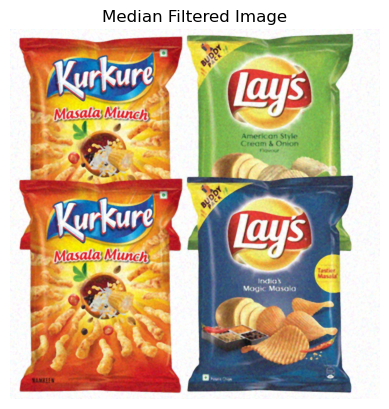

In [263]:
median_filtered = cv2.medianBlur(gaussian_img, 5)

plt.imshow(median_filtered)
plt.title("Median Filtered Image")
plt.axis("off")
plt.show()

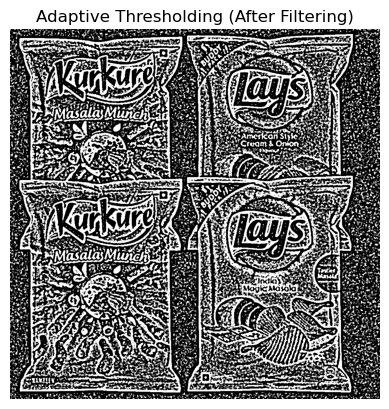

In [264]:
gray_median = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)

binary_after = cv2.adaptiveThreshold(
    gray_median,
    255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY_INV,
    11,
    2
)

plt.imshow(binary_after, cmap='gray')
plt.title("Adaptive Thresholding (After Filtering)")
plt.axis("off")
plt.show()


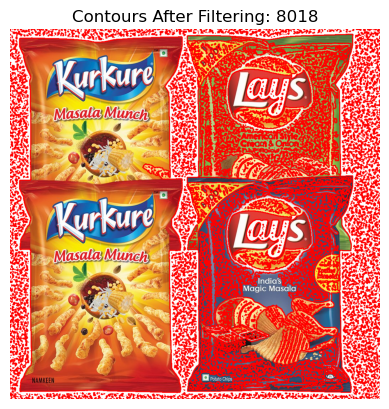

In [265]:
contours_after, _ = cv2.findContours(
    binary_after,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

contour_img_after = img.copy()
cv2.drawContours(contour_img_after, contours_after, -1, (255,0,0), 2)

plt.imshow(contour_img_after)
plt.title(f"Contours After Filtering: {len(contours_after)}")
plt.axis("off")
plt.show()

areas_after = [cv2.contourArea(c) for c in contours_after]
mean_area_after = np.mean(areas_after) if areas_after else 0


In [266]:
# Difference in number of contours
contour_difference = len(contours_after) - len(contours_before)

# Change in average contour area
area_change = mean_area_after - mean_area_before

# Percentage improvement in detection accuracy
# (Assuming median-filtered result is closer to ground truth)
accuracy_improvement = (
    abs(len(contours_before) - len(contours_after)) / len(contours_before)
) * 100 if len(contours_before) != 0 else 0

print("Number of contours before filtering :", len(contours_before))
print("Number of contours after filtering  :", len(contours_after))
print("Difference in contours              :", contour_difference)

print("\nMean contour area before filtering :", mean_area_before)
print("Mean contour area after filtering  :", mean_area_after)
print("Change in mean area                :", area_change)

print("\nPercentage improvement in detection accuracy : {:.2f}%".format(accuracy_improvement))


Number of contours before filtering : 8658
Number of contours after filtering  : 8018
Difference in contours              : -640

Mean contour area before filtering : 90.23307923307924
Mean contour area after filtering  : 73.15315540034922
Change in mean area                : -17.079923832730017

Percentage improvement in detection accuracy : 7.39%


### Q9. Detect all rectangular objects in "boxes.png".For each bounding rectangle, compute the angle of orientation using minAreaRect().​
Create a list showing:​
* box ID​
* angle​
* area​
  
Then analyse:​
* Are most boxes aligned?​
* Any rotated boxes indicating misplacement?

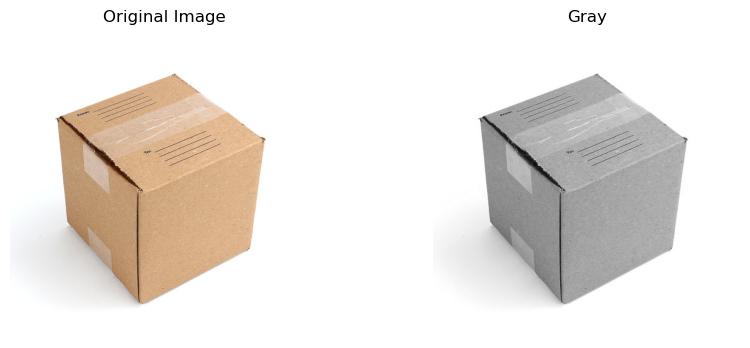

In [287]:
img = cv2.imread("boxes.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize = (10,4))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.show()

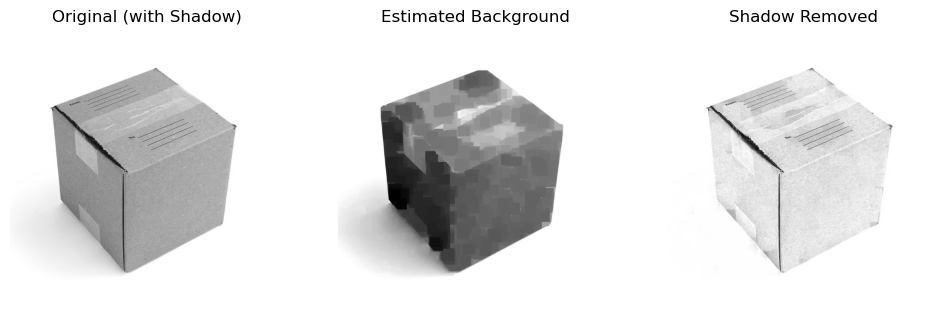

In [288]:
# Large kernel to estimate background illumination
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (35, 35)) #Only slow illumination changes (shadows, lighting) are captured

# | Parameter      | Meaning             |
# | -------------- | ------------------- |.     Small white noise → removed
# | `binary`       | Input binary image  |.     Small white noise → removed
# | `kernel`       | Structuring element |      Touching objects → may separate
# | `iterations=1` | Apply erosion once  |


background = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, kernel) #Closing = Dilation followed by Erosion

# Normalize image by background
shadow_removed = cv2.divide(gray, background, scale=255) #Divides each pixel in the original image by the background illumination

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(gray, cmap='gray')
plt.title("Original (with Shadow)")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(background, cmap='gray')
plt.title("Estimated Background")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(shadow_removed, cmap='gray')
plt.title("Shadow Removed")
plt.axis("off")

plt.show()


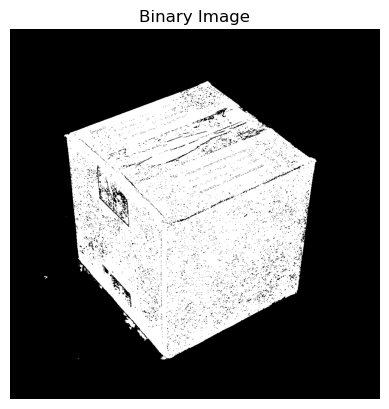

In [289]:
# Binary threshold
_, binary = cv2.threshold(
    shadow_removed, 244, 255,
    cv2.THRESH_BINARY_INV
)

plt.imshow(binary, cmap='gray')
plt.title("Binary Image")
plt.axis("off")
plt.show()

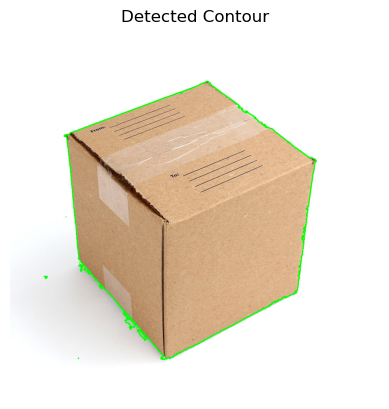

In [290]:
contours, _ = cv2.findContours(
    binary,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)
img_contour= img.copy()
cv2.drawContours(img_contour, contours, -1, (0,255,0), 2)
plt.imshow(img_contour)
plt.title("Detected Contour")
plt.axis("off")
plt.show()

In [291]:
results = []  # stores box_id, angle, area

output = img.copy()
box_id = 1

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    # Ignore very small objects (noise)
    if area < 500:
        continue
    
    rect = cv2.minAreaRect(cnt)
    (cx, cy), (w, h), angle = rect
    
    # Normalize angle (OpenCV quirk)
    if w < h:
        angle = angle + 90
    
    # Box points
    box = cv2.boxPoints(rect)
    box = box.astype(int)
    
    # Draw rectangle
    cv2.drawContours(output, [box], 0, (0,255,0), 2)
    
    results.append({
        "Box ID": box_id,
        "Angle (deg)": round(angle, 2),
        "Area": round(area, 2)
    })
    
    box_id += 1


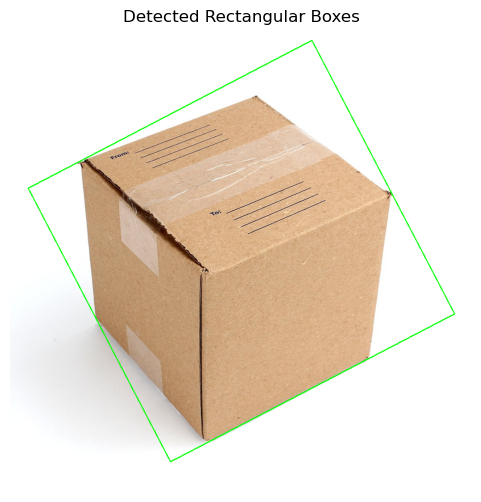

In [292]:
plt.figure(figsize=(6,6))
plt.imshow(output)
plt.title("Detected Rectangular Boxes")
plt.axis("off")
plt.show()

In [293]:
import pandas as pd

df = pd.DataFrame(results)
df

,Box ID,Angle (deg),Area
0,1,152.5,348486.0


### Q10. Perform Otsu’s thresholding on "fruits_segment.png", detect contours, and compute SSIM and PSNR between:​
* original grayscale image
* binary mask scaled to 0–255

Interpret:
* Is segmentation too harsh or reasonable?
* Do edges align well?

In [294]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

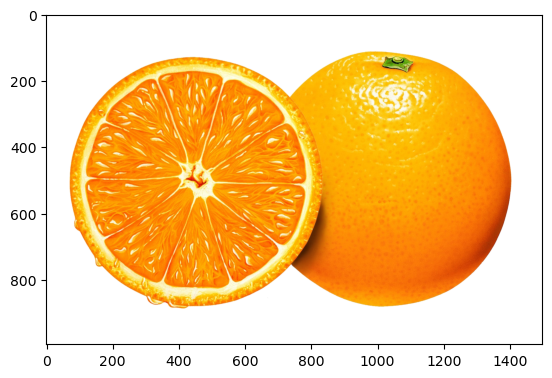

In [295]:

img = cv2.imread("fruit_segment.png")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)

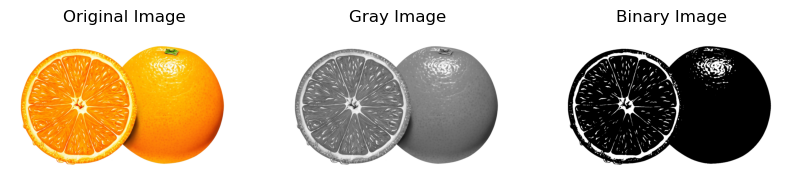

In [296]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.figure(figsize = (10,4)) # width x height

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis('off')
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis('off')
plt.title("Gray Image")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis('off')
plt.title('Binary Image')

plt.show()

In [297]:
contours, _ = cv2.findContours(
    binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)
object_count = len(contours)
ssim_value = ssim(gray, binary, data_range=255)
psnr_value = psnr(gray, binary, data_range=255)
print("Otsu Thresholding Analysis")
print("-" * 40)
print(f"Objects Detected        : {object_count}")
print(f"SSIM (Gray vs Binary)   : {ssim_value:.4f}")
print(f"PSNR (Gray vs Binary)   : {psnr_value:.2f} dB")

Otsu Thresholding Analysis
----------------------------------------
Objects Detected        : 1
SSIM (Gray vs Binary)   : 0.4702
PSNR (Gray vs Binary)   : 9.34 dB
